In [1]:
!pip install tqdm

In [18]:
import tensorflow as tf  
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.vgg19 import VGG19
from tensorflow.keras import Input, Model, Sequential
from tensorflow.keras import layers
from tensorflow.keras.layers import Input, Conv2D, AveragePooling2D, concatenate, Dropout, Lambda, GlobalAveragePooling2D, Dense
from sklearn.metrics import roc_curve, auc

from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA

from skimage import io
from skimage.transform import resize

import numpy as np

from matplotlib import pyplot as plt
import matplotlib.pyplot as plt
import cv2

import random
import os
from tqdm import tqdm

from random import randrange

## Custom Data Generator

In [19]:
class CustomDataGen(tf.keras.utils.Sequence):
    
    def __init__(self, path = "../input/mvtecad-mvtec-anomaly-detection/mvtec_anomaly_detection/leather/",
                 batch_size = 4,
                 input_size=(224, 224),
                 shuffle=True, seed = None, subset = 'training'):
        
        self.image_data_generator = ImageDataGenerator(rescale=1. / 255, data_format='channels_last',
            #width_shift_range = 0.05,
            #height_shift_range = 0.05,
            #brightness_range=(0.95,1.05)
        )
        
        if seed is None:
            random.randint(0, 2**32)
            
        self.batch_size = batch_size
        self.input_size = input_size
        
        self.X_paths = [os.fsdecode(file) for file in os.scandir(f"{path}/train/good")]
        self.X_train, self.X_val = train_test_split(self.X_paths, test_size=0.2, random_state = seed, shuffle = True)
        
        if subset == 'training':            
            self.X = self.X_train
        elif subset == 'validation':
            self.X = self.X_val
            
        self.n = len(self.X)
    
    
    def __getitem__(self, index):
        
        data_x = []
        
        for i in range(self.batch_size):
            image = cv2.imread(self.X[self.batch_size * index + i])
            
            image = self.image_data_generator.random_transform(image)
            
            image = image / 255
            
            image = tf.image.resize(image, self.input_size)
            data_x.append(image)
            
        data_x = np.array(data_x)
        
        return data_x, data_x
    
    def __len__(self):            
        return self.n // self.batch_size

In [20]:
INPUT_SIZE = (224,224)
seed = random.randint(0, 2**32)
train_datagen = CustomDataGen(input_size = INPUT_SIZE, batch_size = 4, seed = seed)
validation_datagen = CustomDataGen(input_size = INPUT_SIZE, subset = "validation", seed = seed) 

In [21]:
#Check we dont have the same images in train and validation sets
any([value in train_datagen.X for value in validation_datagen.X])

False

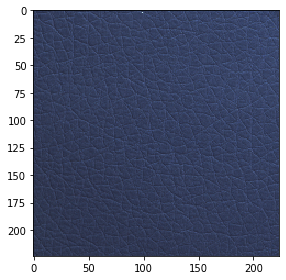

In [22]:
x, y = train_datagen[0]
io.imshow(x[0])
io.show()

## Model

In [23]:
input_model_filepath = "../input/anomalysegmentation-weights/anomaly-segmentation-model_vgg19.h5"
output_model_filepath = "./anomaly-segmentation-model.h5"
class AnomalySegmentator(tf.keras.Model):
    def __init__(self, init_layer = 0, end_layer = None):
        super(AnomalySegmentator, self).__init__()
        self.init_layer = init_layer
        self.end_layer = end_layer
        
    def build_autoencoder(self, c0, cd):
        self.autoencoder = Sequential([
            layers.InputLayer((self.map_shape[0]//4, self.map_shape[1]//4, c0)),
            layers.Conv2D((c0 + cd) // 2,(1,1), padding='same', activation = tf.keras.layers.LeakyReLU(alpha=0.1)),
            layers.Conv2D(2*cd,(1,1), padding='same', activation = tf.keras.layers.LeakyReLU(alpha=0.1)),
            layers.Conv2D(cd,(1,1), padding='same'),
            layers.Conv2D(2*cd,(1,1), padding='same', activation = tf.keras.layers.LeakyReLU(alpha=0.1)),
            layers.Conv2D((c0 + cd) // 2,(1,1), padding='same', activation = tf.keras.layers.LeakyReLU(alpha=0.1)),
            layers.Conv2D(c0,(1,1), padding='same')            
            
        ])
        
    def build(self, input_shape):
        
        self.vgg = VGG19(include_top = False, weights = 'imagenet', input_shape=input_shape[1:])
        self.features_list = [layer.output for layer in self.vgg.layers if 'conv' in layer.name][self.init_layer:self.end_layer]
        
        self.feature_extractor = Model(inputs = self.vgg.input, 
                                       outputs = self.features_list)
        self.feature_extractor.trainable = False   
        
        self.threshold = tf.Variable(0, trainable = False, dtype = tf.float32)

        self.map_shape = self.features_list[0].shape[1:-1]
        
        self.average_pooling = layers.AveragePooling2D(pool_size=(4, 4), strides=(4,4))       
        
        
        
        self.c0 = sum([feature.shape[-1] for feature in self.features_list])        
        self.cd = 40        
        self.build_autoencoder(self.c0, self.cd)
        
          
    def call(self, inputs):
        features = self.feature_extractor(inputs)
        resized_features = [tf.image.resize(feature, self.map_shape) for feature in features]
        resized_features = tf.concat(resized_features, axis = -1)
        
        resized_features = self.average_pooling(resized_features)

        autoencoder_output = self.autoencoder(resized_features)
        return tf.reduce_sum((autoencoder_output - resized_features)**2, axis = -1)
        
    def reconstruction_loss(self):
        @tf.function
        def _loss(y_true, y_pred):
            loss = tf.reduce_mean(y_pred, axis = (1,2)) / (tf.cast(tf.shape(y_pred)[0], tf.float32) * self.c0)
            return loss
                    
        return _loss

    def compute_threshold(self, data_loader, fpr = 0.05):
        error = []
        for i in tqdm(range(len(data_loader))):
            x, y = data_loader[i]
            error.append(self(x))
        error = np.concatenate(error)
        threshold = np.percentile(error, 100 - fpr)
        self.threshold = tf.Variable(threshold, trainable = False, dtype = tf.float32)
        return error
    
    def compute_pca(self, data_loader):
        extraction_per_sample = 20
        
        extractions = []        
        for i in tqdm(range(len(data_loader))):
            x, _ = data_loader[i]     
            
            features = self.feature_extractor(x)
            resized_features = [tf.image.resize(feature, self.map_shape) for feature in features]
            resized_features = tf.concat(resized_features, axis = -1)

            resized_features = self.average_pooling(resized_features)
            
            for feature in resized_features:
                
                for _ in range(extraction_per_sample):                    
                
                    row, col = randrange(feature.shape[0]), randrange(feature.shape[1])
                    extraction = feature[row, col]
                    extractions.append(extraction)
            
        extractions = np.array(extractions)
        print(f"Extractions Shape: {extractions.shape}")
        pca = PCA(0.9, svd_solver = "full")
        pca.fit(extractions)
        self.cd = pca.n_components_
        self.build_autoencoder(self.c0, self.cd)
        print(f"Components with explainable variance 0.9 -> {self.cd}")
        
as_model = AnomalySegmentator()
as_model.compile(Adam(1e-4), loss = as_model.reconstruction_loss())

In [24]:
as_model.build((None, *INPUT_SIZE,3))
as_model.compute_pca(train_datagen)

100%|██████████| 49/49 [00:23<00:00,  2.07it/s]


Extractions Shape: (3920, 5504)
Components with explainable variance 0.9 -> 15


## Training

Epoch 1/10
49/49 [==============================] - 67s 1s/step - loss: 3.4006 - val_loss: 1.0158
Epoch 2/10
49/49 [==============================] - 56s 1s/step - loss: 0.7154 - val_loss: 0.4899
Epoch 3/10
49/49 [==============================] - 57s 1s/step - loss: 0.3912 - val_loss: 0.3338
Epoch 4/10
49/49 [==============================] - 56s 1s/step - loss: 0.3111 - val_loss: 0.2855
Epoch 5/10
49/49 [==============================] - 57s 1s/step - loss: 0.2585 - val_loss: 0.2327
Epoch 6/10
49/49 [==============================] - 56s 1s/step - loss: 0.2164 - val_loss: 0.1972
Epoch 7/10
49/49 [==============================] - 57s 1s/step - loss: 0.1843 - val_loss: 0.1708
Epoch 8/10
49/49 [==============================] - 57s 1s/step - loss: 0.1620 - val_loss: 0.1503
Epoch 9/10
49/49 [==============================] - 57s 1s/step - loss: 0.1467 - val_loss: 0.1392
Epoch 10/10
49/49 [==============================] - 56s 1s/step - loss: 0.1376 - val_loss: 0.1339


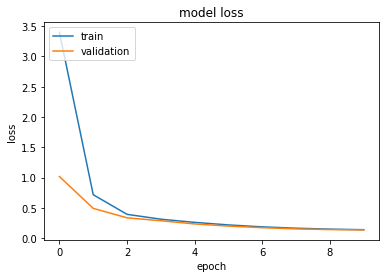

100%|██████████| 49/49 [00:33<00:00,  1.46it/s]


In [25]:
#True if we want to train the model
if True:
    # Training the model
    plateau = tf.keras.callbacks.ReduceLROnPlateau(
      monitor='val_loss', factor=0.5, patience=5, verbose = 1
    )
    es = tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', verbose=1,
                                          patience=15)  # Early stopping (stops training when validation doesn't improve for {patience} epochs)
    save_best = tf.keras.callbacks.ModelCheckpoint(output_model_filepath, monitor='val_loss', save_best_only=True,
                                                mode='min', save_weights_only = True)  # Saves the best version of the model to disk (as measured on the validation data set)
          
    history = as_model.fit(train_datagen,
        epochs=10,
        validation_data=validation_datagen,
        shuffle=True,
        batch_size=1,
        callbacks=[es, save_best, plateau])
    #Training history
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'validation'], loc='upper left')
    plt.show()
    
    as_model.load_weights(output_model_filepath)
    as_model.compute_threshold(train_datagen)
    as_model.save_weights(output_model_filepath)
else:
    
    as_model.build((None, *INPUT_SIZE,3))
    as_model.load_weights(input_model_filepath)
    as_model.compute_threshold(train_datagen)
    as_model.summary()
    as_model.autoencoder.summary()

# TESTING

In [30]:
classes = ['color', 'cut', 'fold', 'glue','good','poke'] 
test_datagen = ImageDataGenerator(rescale=1. / 255, data_format='channels_last')
test_generator = test_datagen.flow_from_directory("../input/mvtecad-mvtec-anomaly-detection/mvtec_anomaly_detection/leather/test", 
                                                  target_size = INPUT_SIZE,
                                                  batch_size = 2,
                                                  shuffle=False,
                                                  class_mode = 'sparse',
                                                  follow_links=True)

Found 124 images belonging to 6 classes.


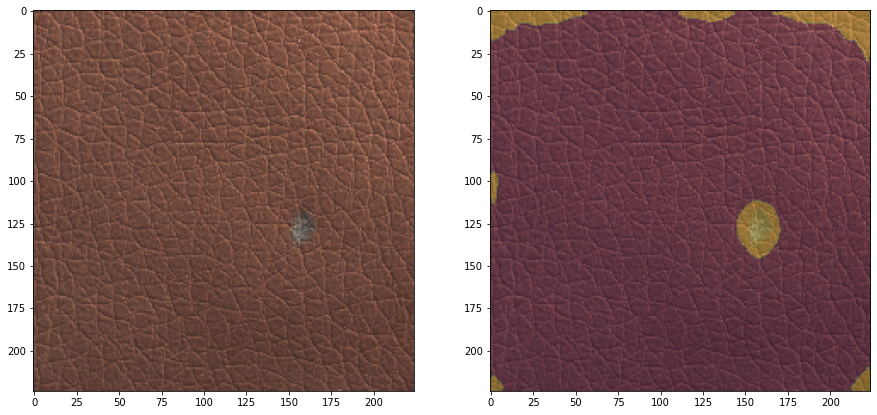

Threshold: 21592.40234375 MaxValue: 61208.42578125
GT: color, anomaly detected: True


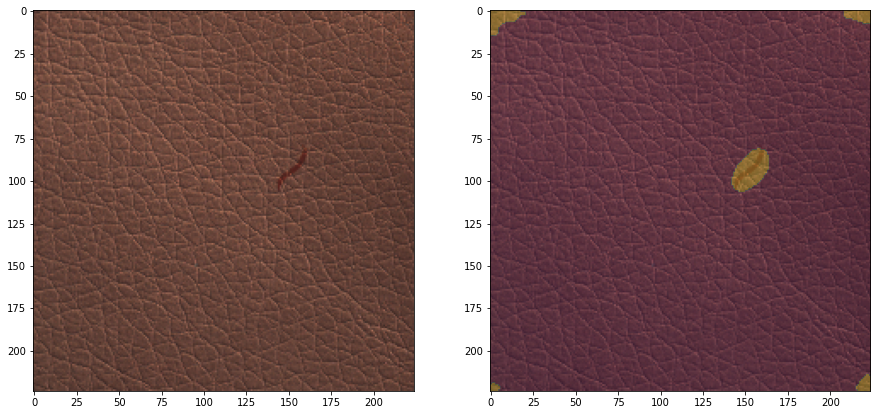

Threshold: 21592.40234375 MaxValue: 37679.8046875
GT: color, anomaly detected: True


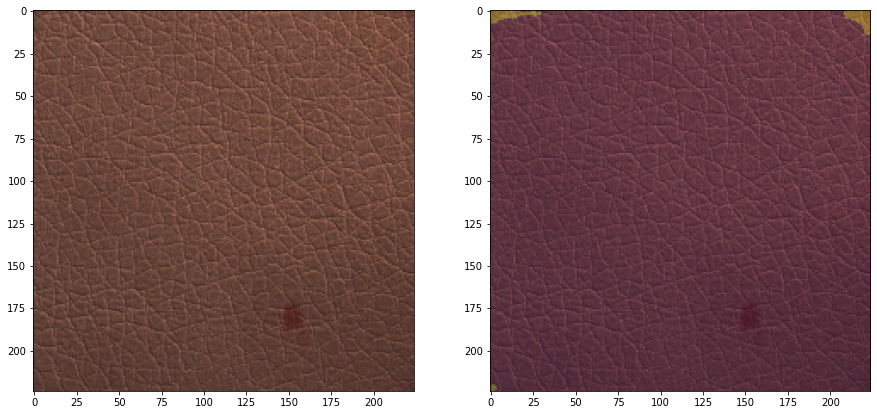

Threshold: 21592.40234375 MaxValue: 31936.953125
GT: color, anomaly detected: True


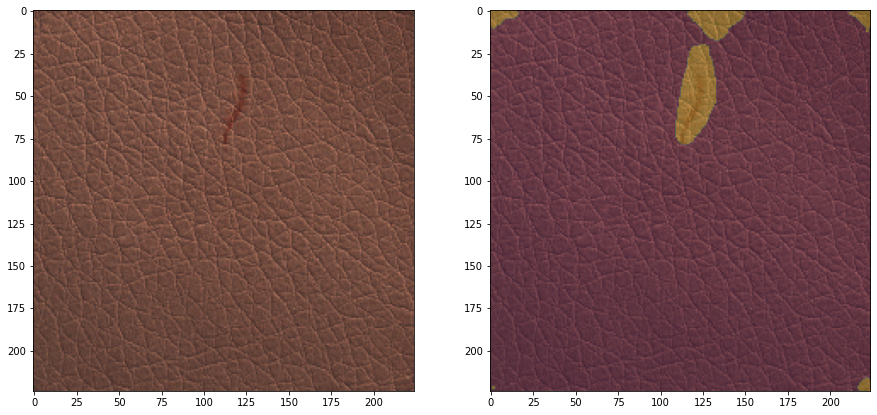

Threshold: 21592.40234375 MaxValue: 45086.453125
GT: color, anomaly detected: True


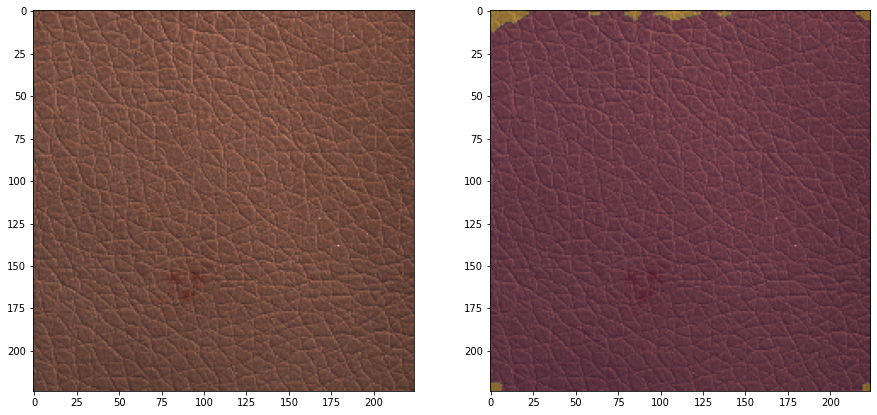

Threshold: 21592.40234375 MaxValue: 33535.22265625
GT: color, anomaly detected: True


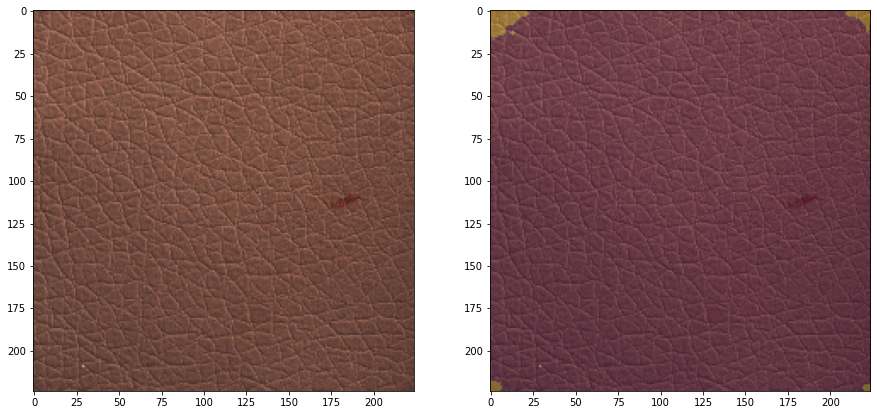

Threshold: 21592.40234375 MaxValue: 37013.01171875
GT: color, anomaly detected: True


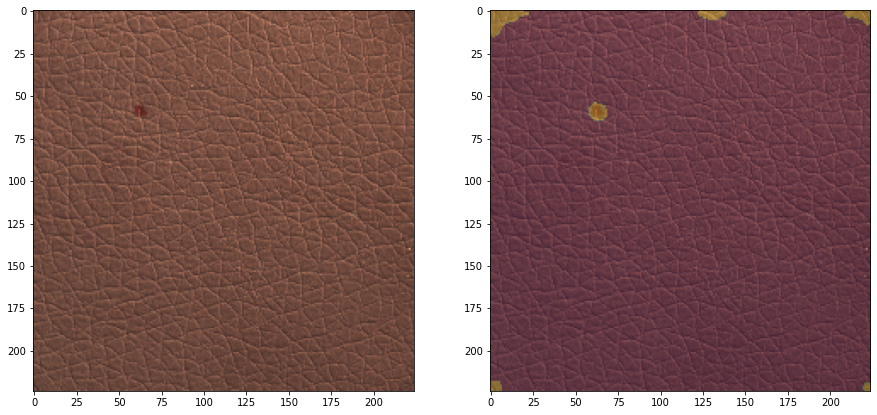

Threshold: 21592.40234375 MaxValue: 33463.42578125
GT: color, anomaly detected: True


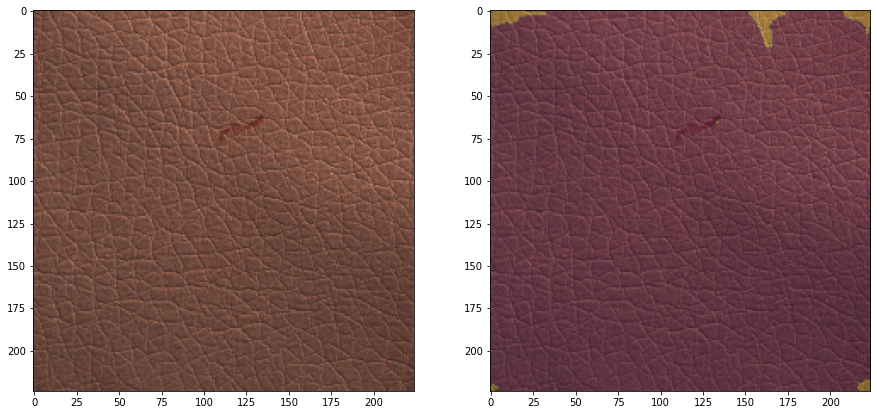

Threshold: 21592.40234375 MaxValue: 31691.904296875
GT: color, anomaly detected: True


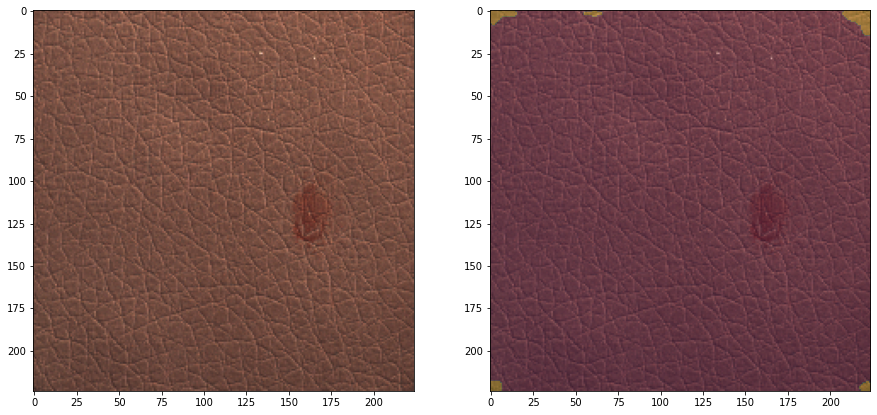

Threshold: 21592.40234375 MaxValue: 36280.5703125
GT: color, anomaly detected: True


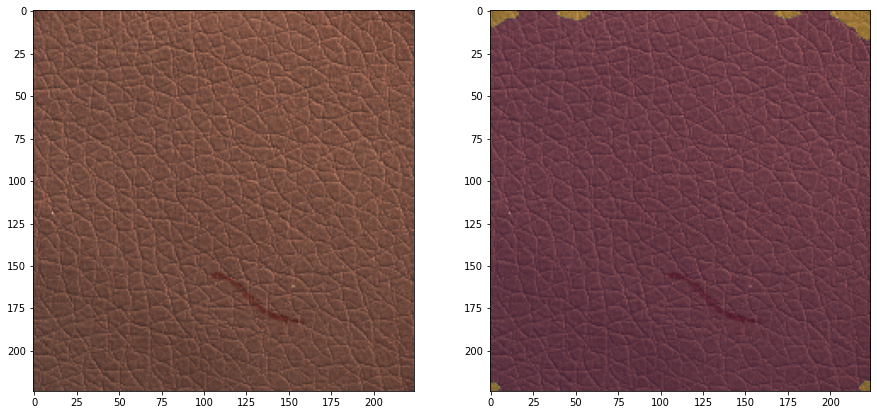

Threshold: 21592.40234375 MaxValue: 37395.92578125
GT: color, anomaly detected: True


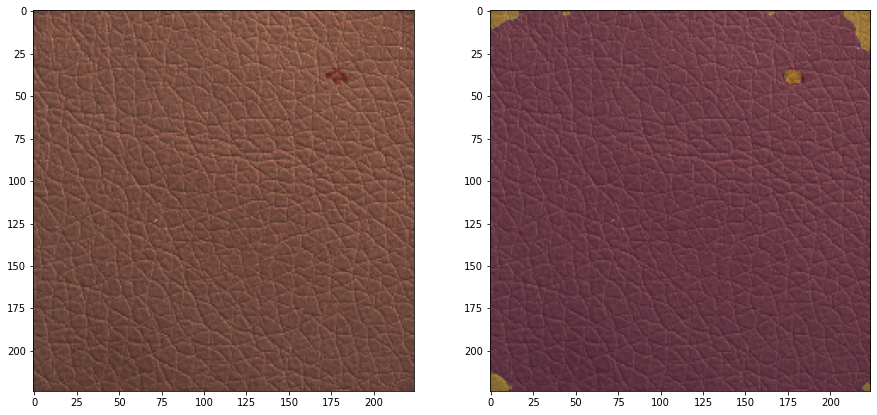

Threshold: 21592.40234375 MaxValue: 35533.65234375
GT: color, anomaly detected: True


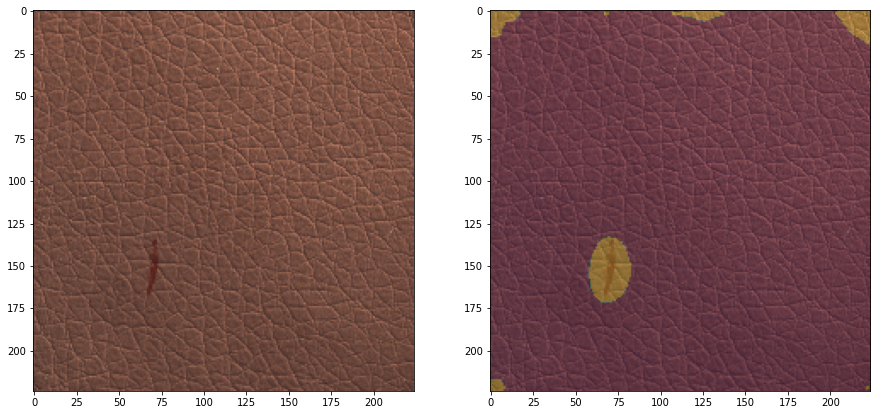

Threshold: 21592.40234375 MaxValue: 66104.9765625
GT: color, anomaly detected: True


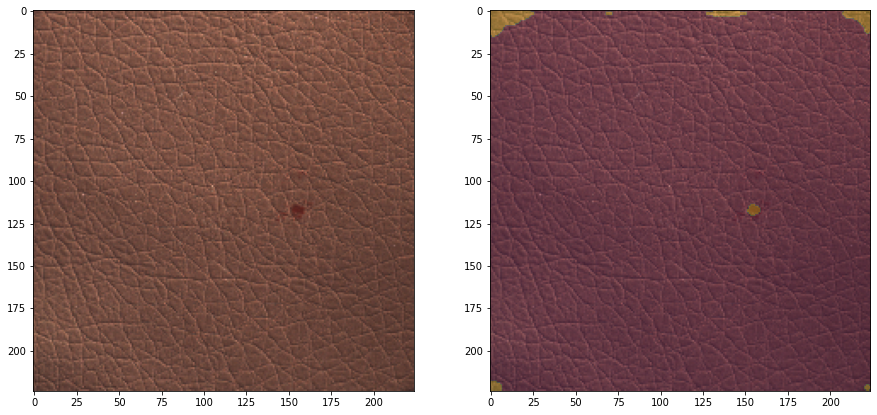

Threshold: 21592.40234375 MaxValue: 36914.09765625
GT: color, anomaly detected: True


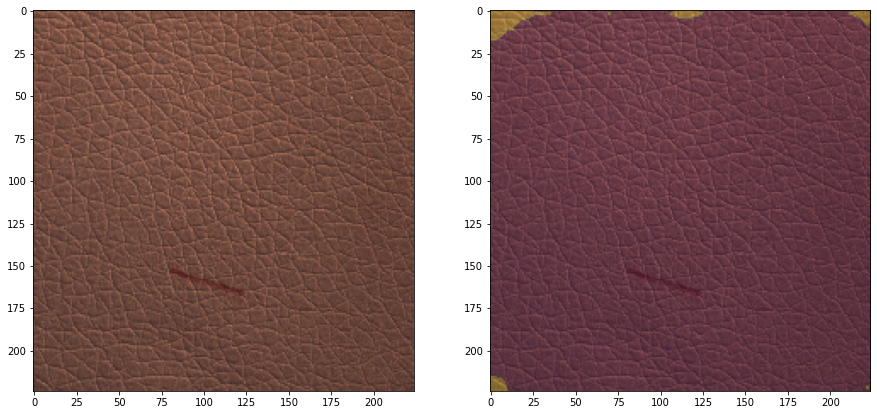

Threshold: 21592.40234375 MaxValue: 42093.48828125
GT: color, anomaly detected: True


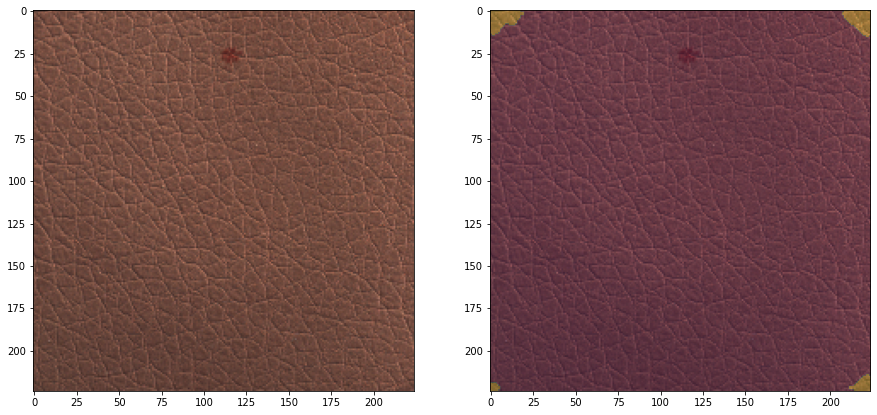

Threshold: 21592.40234375 MaxValue: 37657.55859375
GT: color, anomaly detected: True


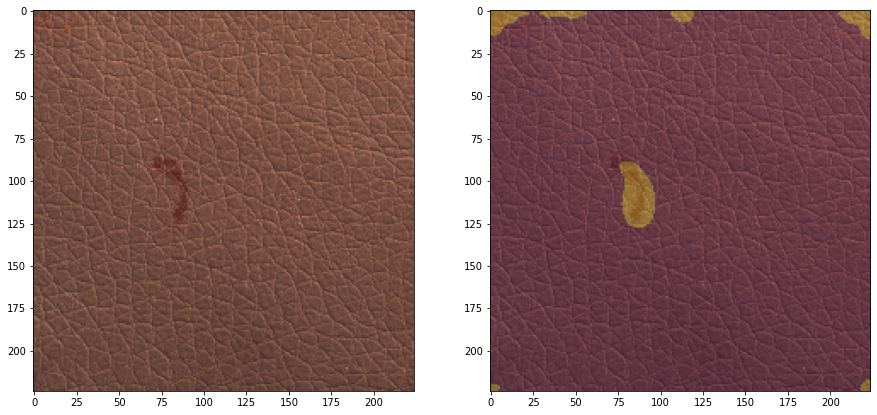

Threshold: 21592.40234375 MaxValue: 43977.49609375
GT: color, anomaly detected: True


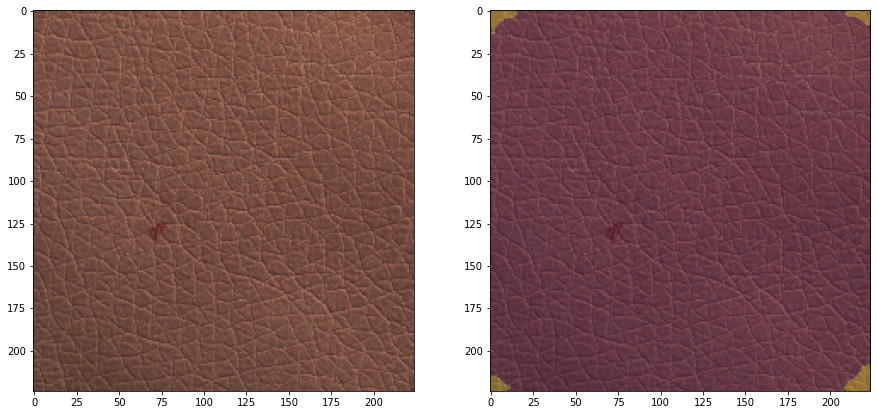

Threshold: 21592.40234375 MaxValue: 35195.53515625
GT: color, anomaly detected: True


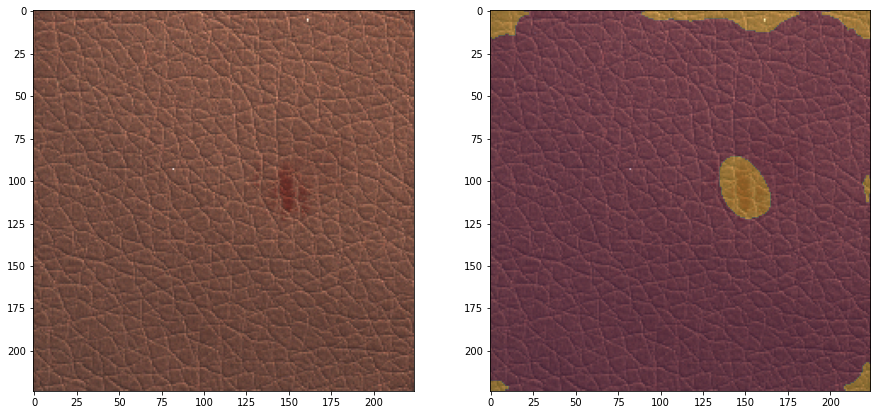

Threshold: 21592.40234375 MaxValue: 51713.37109375
GT: color, anomaly detected: True


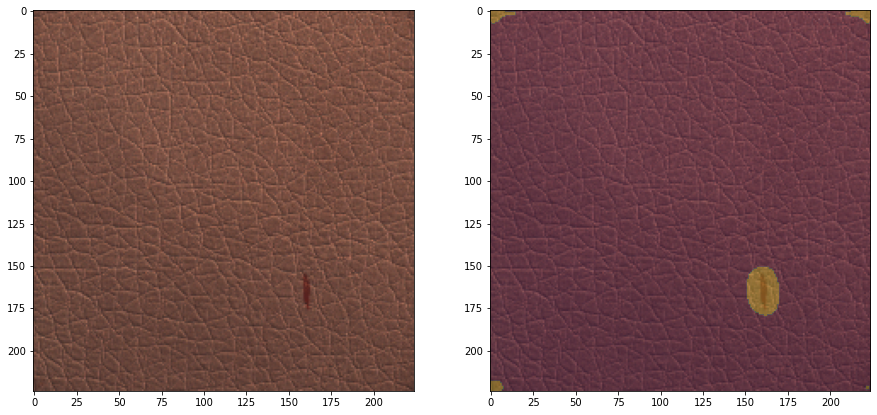

Threshold: 21592.40234375 MaxValue: 51767.671875
GT: color, anomaly detected: True


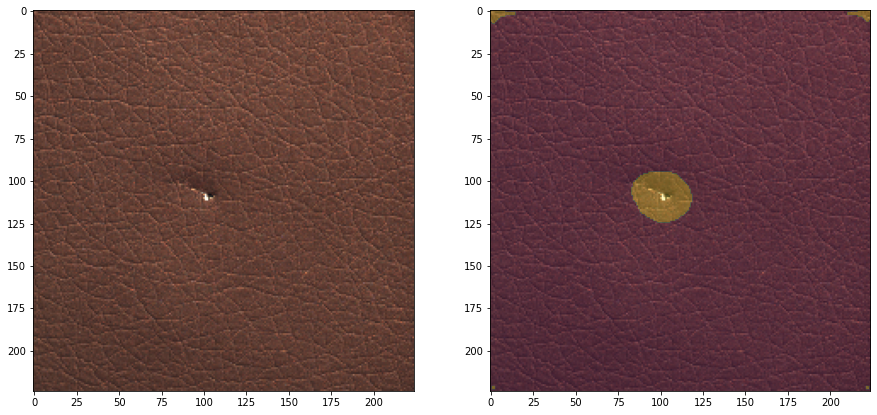

Threshold: 21592.40234375 MaxValue: 147913.265625
GT: cut, anomaly detected: True


In [31]:
for i in range(10):
    x_batch, y_batch = next(test_generator)    
    hotmaps = as_model(x_batch)
    for x, y, hotmap in zip(x_batch, y_batch, hotmaps):

        prediction = np.any(hotmap > as_model.threshold)

        hotmap = resize(hotmap, x.shape[:-1], anti_aliasing = True)
        mask = np.where(hotmap > as_model.threshold, 1, 0)
        

        f, axarr = plt.subplots(1,2, figsize=(15,15))
        axarr[0].imshow(x)
        axarr[1].imshow(mask)
        axarr[1].imshow(x, alpha = 0.75)
        plt.show()

        print(f"Threshold: {as_model.threshold.numpy()} MaxValue: {hotmap.max()}")
        print(f"GT: {classes[int(y)]}, anomaly detected: {prediction}")
    

**Image for Detection**

In [34]:
def load_and_preprocess_image(image_path, input_size):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = tf.image.resize(image, input_size)
    image = image / 255.0
    image = image.numpy().reshape(1, *input_size, 3)
    return image

image_path = "/kaggle/input/test-images/Leather2/images/005.png"
image = load_and_preprocess_image(image_path, INPUT_SIZE)
hotmap = as_model(image)
prediction = np.any(hotmap > as_model.threshold)
print(f"Anomaly detected: {prediction}")

Anomaly detected: True


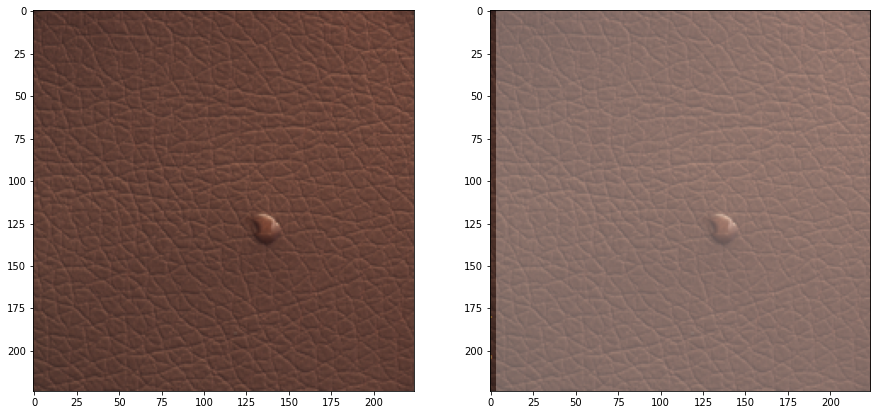

Threshold: 21592.40234375 MaxValue: 93916.5078125
anomaly detected: True


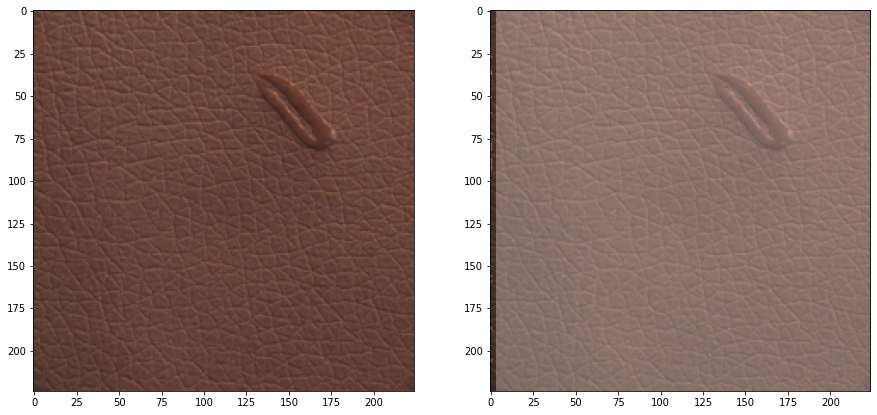

Threshold: 21592.40234375 MaxValue: 56704.921875
anomaly detected: True


In [41]:
from PIL import Image
from sklearn.metrics import precision_score, recall_score, f1_score

# Define the input size for the model
INPUT_SIZE = (224, 224)

# Define the function to load and preprocess the input image
def load_and_preprocess_image(image_path, input_size):
    # Extract the class label from the image path
    class_label = image_path.split("/")[-3]

    image = Image.open(image_path).convert("RGB")
    image = image.resize(input_size, resample=Image.BICUBIC)
    image = np.array(image) / 255.0
    mask = np.where(image > 0.5, 1, 0)
    image = np.expand_dims(image, axis=0)

    return image, mask, class_label

# Define the path to the input image
image_paths = ["/kaggle/input/test-images/Leather2/images/002.png", "/kaggle/input/test-images/Leather2/images/003.png"]

# Define the list to store the anomaly detection results
results = []

# Define the function to evaluate the model on a single image
def evaluate_model(as_model, image, mask, class_label):
    # Predict the anomaly score map using the model
    hotmap = as_model(image)

    # Threshold the hotmap to create a binary mask
    prediction = np.any(hotmap > as_model.threshold)

    # Compute the evaluation metrics
    evaluation_metrics = {
        "precision": precision_score(mask[0].flatten(), prediction.flatten()),
        "recall": recall_score(mask[0].flatten(), prediction.flatten()),
        "f1_score": f1_score(mask[0].flatten(), prediction.flatten())
    }

    # Print the evaluation metrics
    print(f"Class label: {class_label}")
    print(f"Threshold: {as_model.threshold.numpy()} MaxValue: {hotmap.numpy().max()}")
    print(f"GT: {class_label}, anomaly detected: {prediction}")
    print(f"Evaluation metrics: {evaluation_metrics}")

# Iterate over the input images
for i, image_path in enumerate(image_paths):
    # Load and preprocess the input image
    image, mask, class_label = load_and_preprocess_image(image_path, INPUT_SIZE)

    # Predict the anomaly score map using the model
    hotmap = as_model(image)

    # Threshold the hotmap to create a binary mask
    prediction = np.any(hotmap > as_model.threshold)

    # Resize the hotmap to match the input image size
    hotmap = tf.image.resize(hotmap, image.shape[1:3], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

    # Display the input image and highlight the defective part
    fig, axs = plt.subplots(1, 2, figsize=(15, 15))
    axs[0].imshow(image[0])
    axs[1].imshow(mask[0], cmap="hot")
    axs[1].imshow(image[0], alpha=0.75)
    plt.show()

    # Print the anomaly detection result
    print(f"Threshold: {as_model.threshold.numpy()} MaxValue: {hotmap.numpy().max()}")
    print(f"anomaly detected: {prediction}")

    # Store the anomaly detection result
    results.append({"image_path": image_path, "gt": class_label, "prediction": prediction})
